## Complex systems project

### Libraraies

In [76]:
import pandas as pd
import json
import networkx as nx

### Data manage

#### Download data

In [77]:
data = pd.read_csv('movie_dataset.csv')

In [78]:
#pd.set_option('display.max_columns', None)

In [79]:
data.head()

,index,budget,genres,homepage,id,keywords,original_language,original_title,overview,popularity,...,runtime,spoken_languages,status,tagline,title,vote_average,vote_count,cast,crew,director
0,0,237000000,Action Adventure Fantasy Science Fiction,http://www.avatarmovie.com/,19995,culture clash future space war space colony so...,en,Avatar,"In the 22nd century, a paraplegic Marine is di...",150.437577,...,162.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}, {""iso...",Released,Enter the World of Pandora.,Avatar,7.2,11800,Sam Worthington Zoe Saldana Sigourney Weaver S...,"[{'name': 'Stephen E. Rivkin', 'gender': 0, 'd...",James Cameron
1,1,300000000,Adventure Fantasy Action,http://disney.go.com/disneypictures/pirates/,285,ocean drug abuse exotic island east india trad...,en,Pirates of the Caribbean: At World's End,"Captain Barbossa, long believed to be dead, ha...",139.082615,...,169.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,"At the end of the world, the adventure begins.",Pirates of the Caribbean: At World's End,6.9,4500,Johnny Depp Orlando Bloom Keira Knightley Stel...,"[{'name': 'Dariusz Wolski', 'gender': 2, 'depa...",Gore Verbinski
2,2,245000000,Action Adventure Crime,http://www.sonypictures.com/movies/spectre/,206647,spy based on novel secret agent sequel mi6,en,Spectre,A cryptic message from Bond’s past sends him o...,107.376788,...,148.0,"[{""iso_639_1"": ""fr"", ""name"": ""Fran\u00e7ais""},...",Released,A Plan No One Escapes,Spectre,6.3,4466,Daniel Craig Christoph Waltz L\u00e9a Seydoux ...,"[{'name': 'Thomas Newman', 'gender': 2, 'depar...",Sam Mendes
3,3,250000000,Action Crime Drama Thriller,http://www.thedarkknightrises.com/,49026,dc comics crime fighter terrorist secret ident...,en,The Dark Knight Rises,Following the death of District Attorney Harve...,112.312950,...,165.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,The Legend Ends,The Dark Knight Rises,7.6,9106,Christian Bale Michael Caine Gary Oldman Anne ...,"[{'name': 'Hans Zimmer', 'gender': 2, 'departm...",Christopher Nolan
4,4,260000000,Action Adventure Science Fiction,http://movies.disney.com/john-carter,49529,based on novel mars medallion space travel pri...,en,John Carter,"John Carter is a war-weary, former military ca...",43.926995,...,132.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,"Lost in our world, found in another.",John Carter,6.1,2124,Taylor Kitsch Lynn Collins Samantha Morton Wil...,"[{'name': 'Andrew Stanton', 'gender': 2, 'depa...",Andrew Stanton


In [80]:
data.head()
df = data[['original_title', 'genres', 'budget', 'production_companies', 'production_countries', 'vote_average']]
df.head()

,original_title,genres,budget,production_companies,production_countries,vote_average
0,Avatar,Action Adventure Fantasy Science Fiction,237000000,"[{""name"": ""Ingenious Film Partners"", ""id"": 289...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",7.2
1,Pirates of the Caribbean: At World's End,Adventure Fantasy Action,300000000,"[{""name"": ""Walt Disney Pictures"", ""id"": 2}, {""...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",6.9
2,Spectre,Action Adventure Crime,245000000,"[{""name"": ""Columbia Pictures"", ""id"": 5}, {""nam...","[{""iso_3166_1"": ""GB"", ""name"": ""United Kingdom""...",6.3
3,The Dark Knight Rises,Action Crime Drama Thriller,250000000,"[{""name"": ""Legendary Pictures"", ""id"": 923}, {""...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",7.6
4,John Carter,Action Adventure Science Fiction,260000000,"[{""name"": ""Walt Disney Pictures"", ""id"": 2}]","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",6.1


#### Extracting the production companies

In [81]:
df.loc[:, 'production_companies'] = df['production_companies'].apply(json.loads)
df.loc[:, 'production_countries'] = df['production_countries'].apply(json.loads)

In [82]:
prod_comp = df['production_companies']

In [83]:
prod_comp_per_film = []
for film in prod_comp:
    pc = []
    for company in film:
        for key in company.keys():
            pc.append(company[key])
            break
    prod_comp_per_film.append(pc)
print(prod_comp_per_film)  

[['Ingenious Film Partners', 'Twentieth Century Fox Film Corporation', 'Dune Entertainment', 'Lightstorm Entertainment'], ['Walt Disney Pictures', 'Jerry Bruckheimer Films', 'Second Mate Productions'], ['Columbia Pictures', 'Danjaq', 'B24'], ['Legendary Pictures', 'Warner Bros.', 'DC Entertainment', 'Syncopy'], ['Walt Disney Pictures'], ['Columbia Pictures', 'Laura Ziskin Productions', 'Marvel Enterprises'], ['Walt Disney Pictures', 'Walt Disney Animation Studios'], ['Marvel Studios', 'Prime Focus', 'Revolution Sun Studios'], ['Warner Bros.', 'Heyday Films'], ['DC Comics', 'Atlas Entertainment', 'Warner Bros.', 'DC Entertainment', 'Cruel & Unusual Films', 'RatPac-Dune Entertainment'], ['DC Comics', 'Legendary Pictures', 'Warner Bros.', 'Bad Hat Harry Productions'], ['Eon Productions'], ['Walt Disney Pictures', 'Jerry Bruckheimer Films', 'Second Mate Productions'], ['Walt Disney Pictures', 'Jerry Bruckheimer Films', 'Infinitum Nihil', 'Silver Bullet Productions (II)', 'Blind Wink Produc

In [84]:
prod_comps = {}
prod_comps_films = {}
for films in prod_comp_per_film:
    for comps in films:
        if comps not in prod_comps:
            prod_comps[comps] = 1
            prod_comps_films[comps] = [films]
        else:
            prod_comps[comps] += 1
            prod_comps_films[comps].append(films)
print(prod_comps_films)

{'Ingenious Film Partners': [['Ingenious Film Partners', 'Twentieth Century Fox Film Corporation', 'Dune Entertainment', 'Lightstorm Entertainment'], ['New Line Cinema', 'Ingenious Film Partners', 'Depth of Field', 'Scholastic Productions'], ['Ingenious Film Partners', 'Twentieth Century Fox Film Corporation', "Donners' Company", 'Dune Entertainment', 'Major Studio Partners', 'Bad Hat Harry Productions', 'thinkfilm', 'Marvel Enterprises', 'X3 Canada Productions', 'X3US Productions', 'XM3 Service'], ['Ingenious Film Partners', 'Ingenious Media', 'Twentieth Century Fox Film Corporation', "Donners' Company", 'Dune Entertainment', 'Dune Entertainment III', 'Marvel Entertainment', 'Bad Hat Harry Productions', 'Big Screen Productions'], ['Ingenious Film Partners', 'Twentieth Century Fox Film Corporation', "Donners' Company", 'Dune Entertainment', 'Seed Productions', 'Bad Hat Harry Productions', 'Big Screen Productions', 'Marvel Enterprises'], ['Bazmark Films', 'Ingenious Film Partners', 'Twe

### Films - Production companies

In [85]:
prod_comp_df = pd.DataFrame({
    'Film': data['original_title'],
    'Production companies' : prod_comp_per_film
})
prod_comp_df

,Film,Production companies
0,Avatar,"[Ingenious Film Partners, Twentieth Century Fo..."
1,Pirates of the Caribbean: At World's End,"[Walt Disney Pictures, Jerry Bruckheimer Films..."
2,Spectre,"[Columbia Pictures, Danjaq, B24]"
3,The Dark Knight Rises,"[Legendary Pictures, Warner Bros., DC Entertai..."
4,John Carter,[Walt Disney Pictures]
...,...,...
4798,El Mariachi,[Columbia Pictures]
4799,Newlyweds,[]
4800,"Signed, Sealed, Delivered","[Front Street Pictures, Muse Entertainment Ent..."
4801,Shanghai Calling,[]


#### Distribution of films for each production company

In [86]:
rev_value_sort = {k : v for k, v in sorted(prod_comps.items(), key = lambda item : item[1], reverse = True)}
print(rev_value_sort)


{'Warner Bros.': 319, 'Universal Pictures': 311, 'Paramount Pictures': 285, 'Twentieth Century Fox Film Corporation': 222, 'Columbia Pictures': 201, 'New Line Cinema': 165, 'Metro-Goldwyn-Mayer (MGM)': 122, 'Touchstone Pictures': 118, 'Walt Disney Pictures': 114, 'Relativity Media': 102, 'Columbia Pictures Corporation': 96, 'Miramax Films': 94, 'Village Roadshow Pictures': 81, 'DreamWorks SKG': 79, 'Canal+': 75, 'United Artists': 75, 'Regency Enterprises': 69, 'Fox Searchlight Pictures': 64, 'Dune Entertainment': 59, 'Lionsgate': 56, 'Fox 2000 Pictures': 55, 'TriStar Pictures': 55, 'Dimension Films': 54, 'Working Title Films': 53, 'Summit Entertainment': 52, 'Amblin Entertainment': 49, 'The Weinstein Company': 42, 'StudioCanal': 41, 'New Regency Pictures': 40, 'Castle Rock Entertainment': 40, 'Screen Gems': 39, 'Spyglass Entertainment': 38, 'BBC Films': 38, 'Scott Rudin Productions': 37, 'Imagine Entertainment': 36, 'Film4': 36, 'Focus Features': 36, 'UK Film Council': 36, 'Legendary P

### First 100 production companies

In [87]:
list_comps = list(rev_value_sort)
nodes_100 = list_comps[0:100]

In [88]:
#graph = nx.Graph()
#for node in nodes:
#    graph.add_node(node)
#print(graph)

In [89]:
graph_100 = nx.Graph()
graph_100.add_nodes_from(nodes_100)

for _, row in prod_comp_df.iterrows():
    companies = row['Production companies']  # list of companies in that movie

    # filter only top 100
    filtered = [c for c in companies if c in nodes_100]

    # connect all pairs of filtered companies
    for i in range(len(filtered)):
        for j in range(i + 1, len(filtered)):
            graph_100.add_edge(filtered[i], filtered[j])

print(graph_100)

Graph with 100 nodes and 866 edges


In [90]:
print("Diameter:", nx.diameter(graph_100))
print("Average clustering:", nx.average_clustering(graph_100))
print("Average shortest path length:", nx.average_shortest_path_length(graph_100))

Diameter: 4
Average clustering: 0.41865205870404715
Average shortest path length: 1.9317171717171717


`Diameter = 4`
- the diameter is the longest shortest path between any two companies in the largest connected component
- even the most distant companies are still fairly close $\Rightarrow$ the network is small and connected = “small-world” network

`Average clustering = 0.419` $\rightarrow$ `42%`
- the clustering coefficient measures how likely it is that two companies that co-produce with the same company also co-produce with each other

`Average shortest path length = 1.932`

- the average shortest path is the average number of steps it takes to get from one company to another (dn average, any company can reach another company in less than 2 steps)

In [91]:
#pd.reset_option('display.max_columns', None)

### All production companies

In [92]:
nodes = list(rev_value_sort.keys())

graph = nx.Graph()
graph.add_nodes_from(nodes)

for _, row in prod_comp_df.iterrows():
    companies = row['Production companies']  # list of companies in that movie

    # connect all pairs of companies in this movie
    for i in range(len(companies)):
        for j in range(i + 1, len(companies)):
            graph.add_edge(companies[i], companies[j])

print(graph)

Graph with 5017 nodes and 20675 edges


In [93]:
print("Average clustering:", nx.average_clustering(graph))

Average clustering: 0.6863527442297406


`Average clustering = 0.6863` $\rightarrow$ `69%`
- the clustering coefficient measures how likely it is that two companies that co-produce with the same company also co-produce with each other

#### Selecting the largest connected components

In [94]:
# largest connected component
largest_cc = max(nx.connected_components(graph), key=len)

G_lcc = graph.subgraph(largest_cc).copy()

print("Diameter:", nx.diameter(G_lcc))
print("Average clustering:", nx.average_clustering(G_lcc))
print("Average shortest path length:", nx.average_shortest_path_length(G_lcc))

Diameter: 10
Average clustering: 0.7462162207594487
Average shortest path length: 3.608457235127247


`Diameter = 10`
- the the distance between two most distant companies in the network require 10 steps to reach each other
- the network is much larger and more spread out than the top-100 subset

`Average clustering = 0.6863` $\rightarrow$ `69%`
- the production company network is very clustered, meaning that companies tend to form tight collaboration and partnerships

`Average shortest path length = 3.6084`
- on average, any company can reach another company in less than 4 steps
- the network is a small-world

### Plot

#### Graph largest connected component

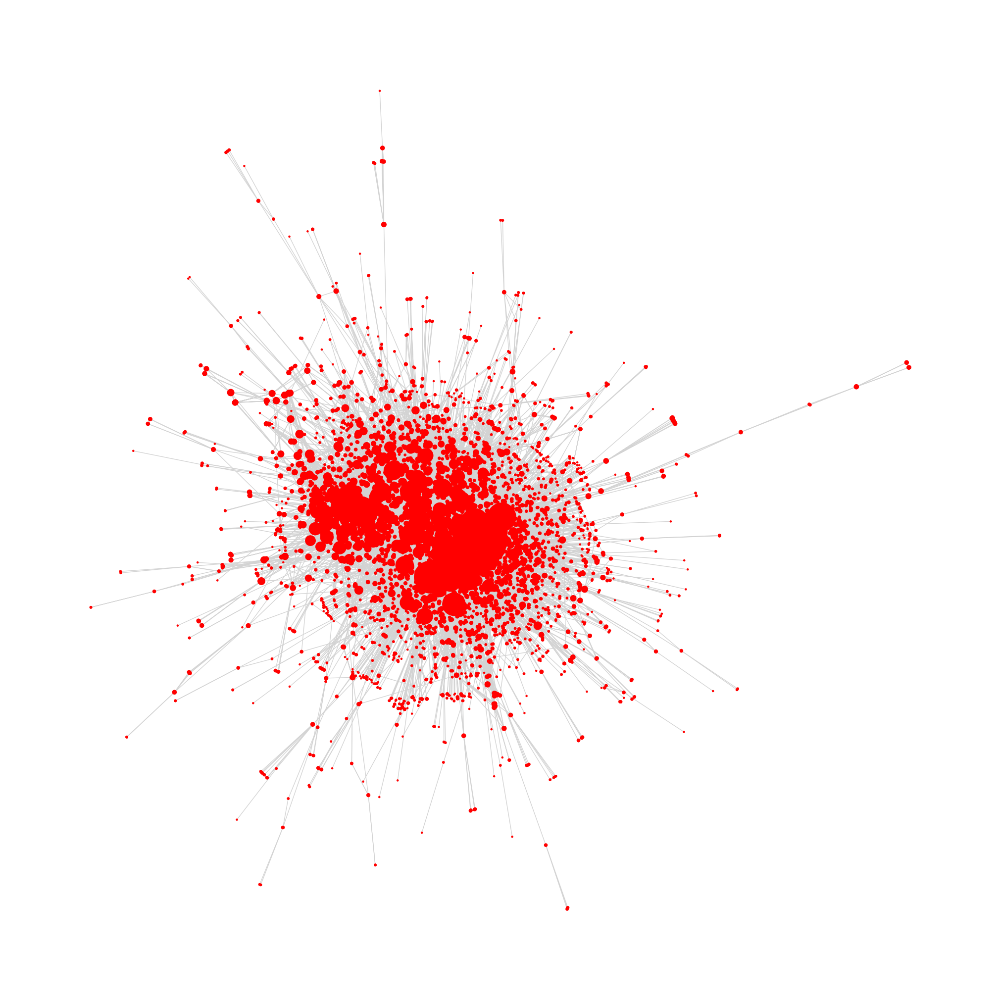

In [95]:
import matplotlib.pyplot as plt


plt.figure(figsize=(20,20))
pos = nx.spring_layout(G_lcc)
node_sizes = [G_lcc.degree(n)*5 for n in G_lcc.nodes()]
nx.draw(G_lcc, pos, node_size=node_sizes, node_color='red', edge_color='lightgray')
plt.show()

#### Graph largest connected components (clusters)

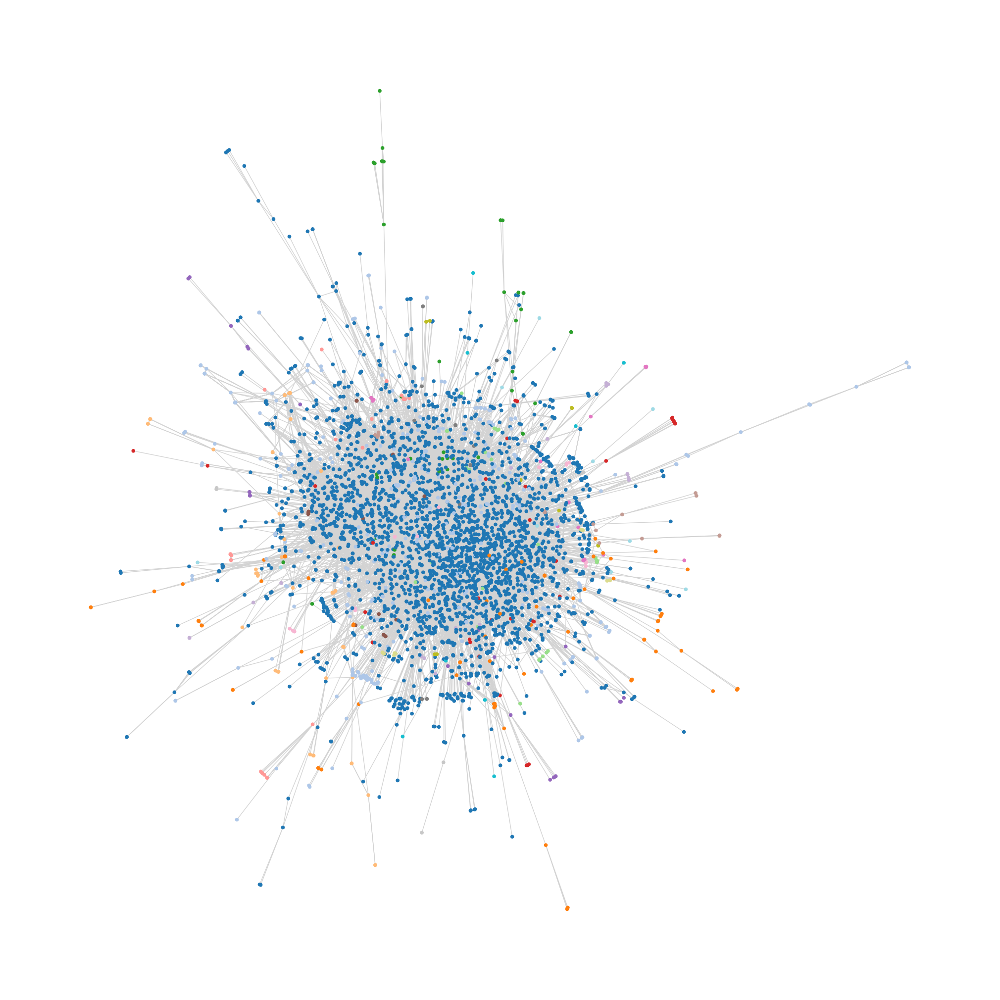

In [96]:
from networkx.algorithms import community

plt.figure(figsize=(20,20))
communities = list(community.greedy_modularity_communities(G_lcc))
cluster_map = {}
for i, comm in enumerate(communities):
    for node in comm:
        cluster_map[node] = i

node_colors = [cluster_map[n] for n in G_lcc.nodes()]
nx.draw(G_lcc, pos, node_size=20, node_color=node_colors, cmap=plt.cm.tab20, edge_color='lightgray')

#### The whole graph

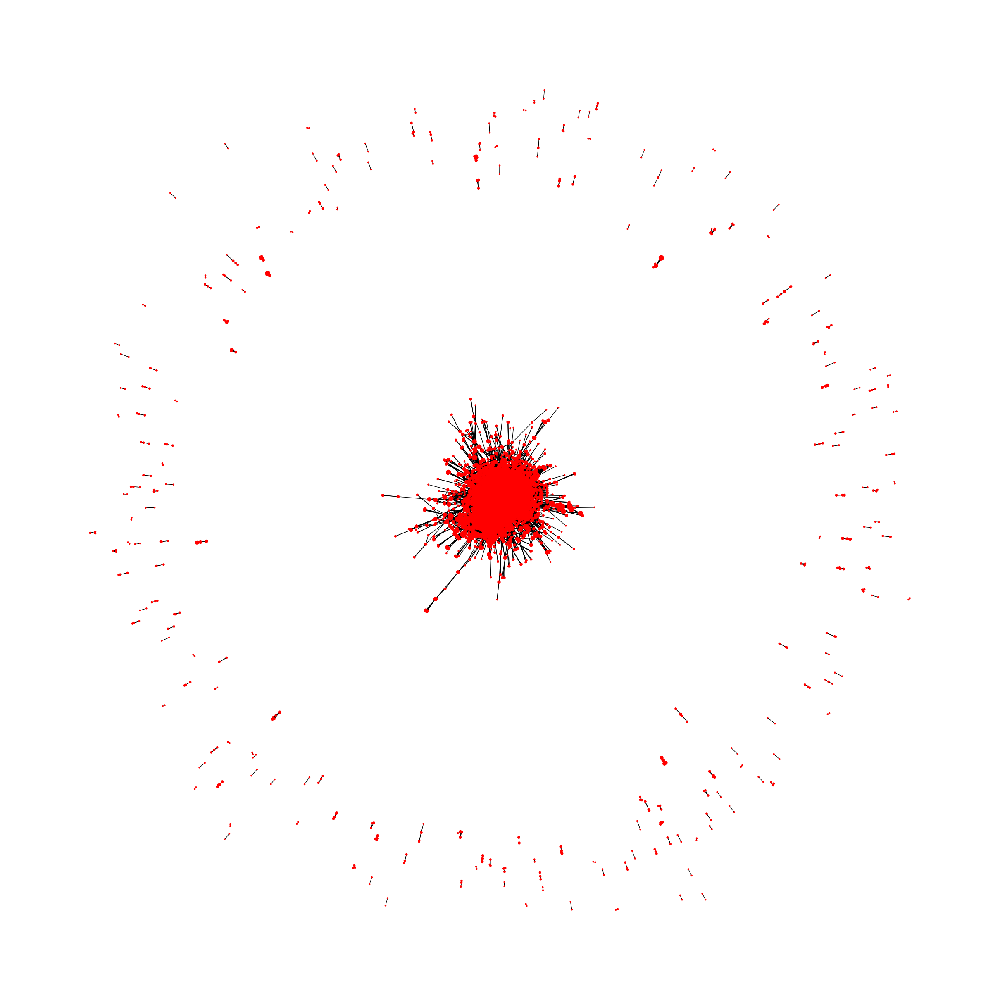

In [97]:
import matplotlib.pyplot as plt


plt.figure(figsize=(24,24))
pos = nx.spring_layout(graph)
node_sizes = [graph.degree(n)*5 for n in graph.nodes()]
nx.draw(graph, pos, node_size=node_sizes, node_color='red', edge_color='black')
plt.show()

#### The whole graph (clusters)

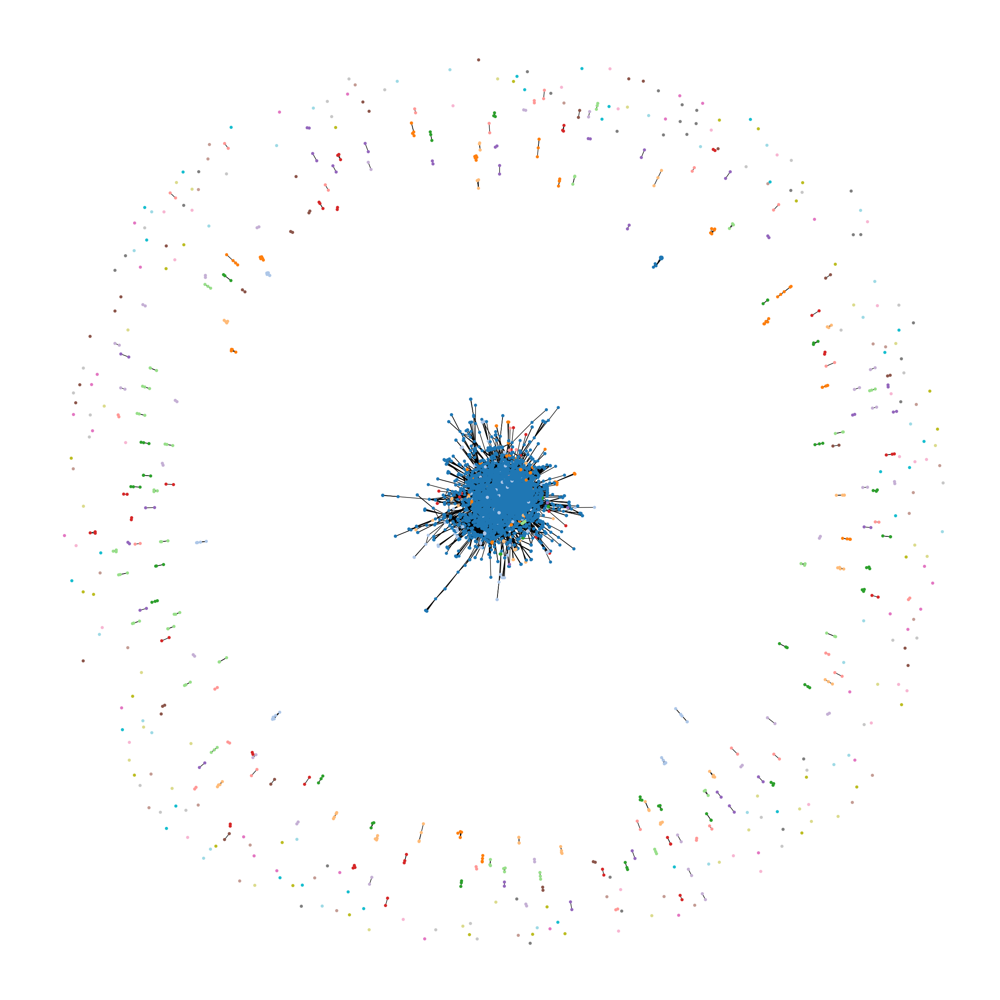

In [98]:
from networkx.algorithms import community

plt.figure(figsize=(24,24))
communities = list(community.greedy_modularity_communities(graph))
cluster_map = {}
for i, comm in enumerate(communities):
    for node in comm:
        cluster_map[node] = i

node_colors = [cluster_map[n] for n in graph.nodes()]
nx.draw(graph, pos, node_size=20, node_color=node_colors, cmap=plt.cm.tab20, edge_color='black')

### Comparision (ER, WS, BA)

In [99]:
graph_nodes = graph.number_of_nodes()
graph_edges = graph.number_of_edges()

print("Number of nodes:", graph_nodes)
print("Number of edges:", graph_edges)

Number of nodes: 5017
Number of edges: 20675


In [100]:
models = {}

#### Erdos-Renyi random graph

In [101]:
ER = nx.erdos_renyi_graph(n=graph_nodes, p=0.01)

ER_lcc = ER.subgraph(max(nx.connected_components(ER), key=len)).copy()
models["ER"] = {
    "Diameter": nx.diameter(ER_lcc),
    "Average clustering": nx.average_clustering(ER_lcc),
    "Average shortest path length": nx.average_shortest_path_length(ER_lcc)
}

In [102]:
for name, metrics in models.items():
    print(name, ":")
    for k, v in metrics.items():
        print(k,":",v)

ER :
Diameter : 3
Average clustering : 0.010024486914729692
Average shortest path length : 2.5898217193917077


`ER`

- diameter = 3 (the longest shortest path is very short and almost all companies are reachable in just a few steps)
- average clustering = 0.01 (1%) (very low clustering, almost no triangles, meaning that companies rarely form tight co-production groups)
- average shortest path = 2.59 (very short, meaning that the network is small, but has no solid structure)
- it is a random network with connections that are only by chance, resulting in no meaningful clusters (very different from real-world co-production patterns)

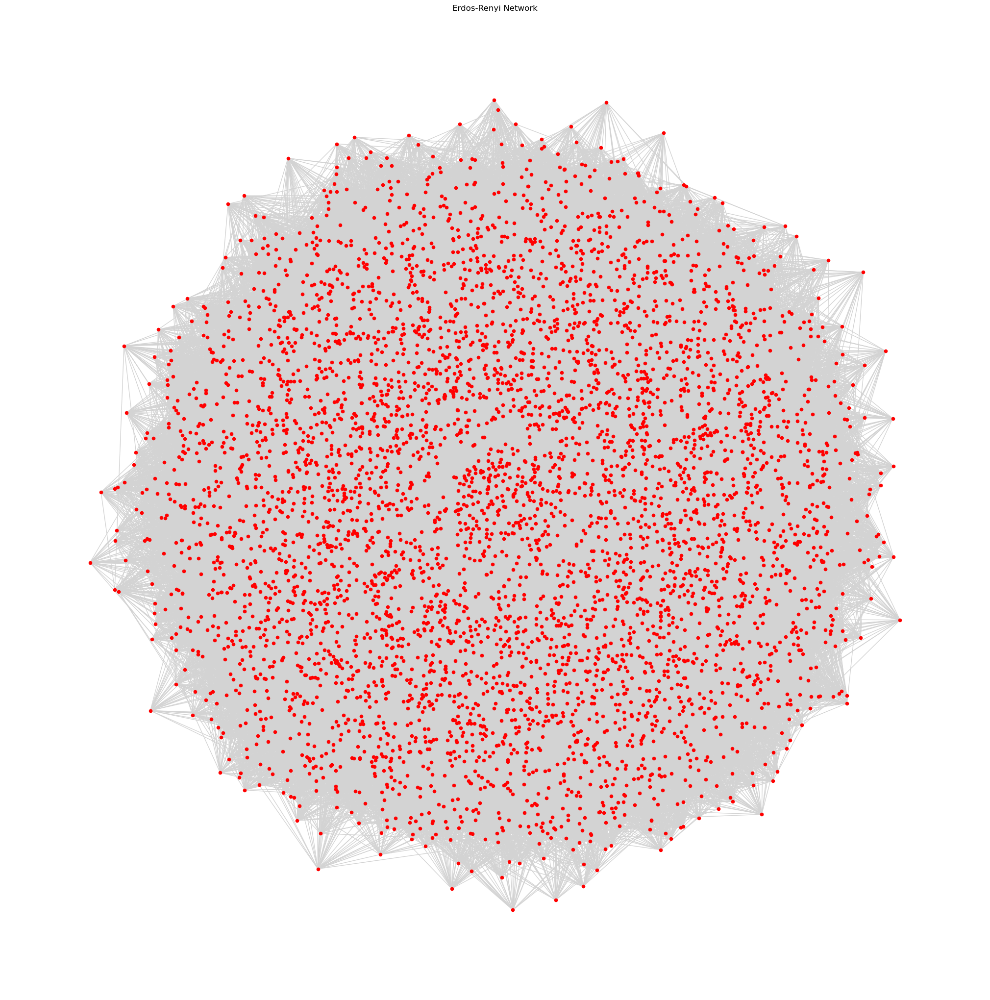

In [103]:
plt.figure(figsize=(20,20))
pos_ER = nx.spring_layout(ER_lcc, seed=42)
nx.draw(ER_lcc, pos_ER, node_size=20, node_color='red', edge_color='lightgray')
plt.title("Erdos-Renyi Network")
plt.show()

#### Watts-Strogatz small-world graph

In [104]:
WS = nx.watts_strogatz_graph(n=graph_nodes, k=4, p=0.1)

WS_lcc = WS.subgraph(max(nx.connected_components(WS), key=len)).copy()
models["WS"] = {
    "Diameter": nx.diameter(WS_lcc),
    "Average clustering": nx.average_clustering(WS_lcc),
    "Average shortest path length": nx.average_shortest_path_length(WS_lcc)
}

In [105]:
for name, metrics in models.items():
    print(name, ":")
    for k, v in metrics.items():
        print(k,":",v)

ER :
Diameter : 3
Average clustering : 0.010024486914729692
Average shortest path length : 2.5898217193917077
WS :
Diameter : 23
Average clustering : 0.37145230027430043
Average shortest path length : 11.378311746441684


`WS`

- diameter = 23 (some nodes are far apart in the network)
- average clustering = 0.371 (37%) (moderate clustering, nodes form some triangles, but it does not simulate the strong conection as real data)
- average shortest path = 11.38 (on average, reaching another node takes 11-12 steps)
- closer to a small-world network, since it captures clustering better than ER, but it is too spread out, so it does not show the dense clusters that are in real co-production networks

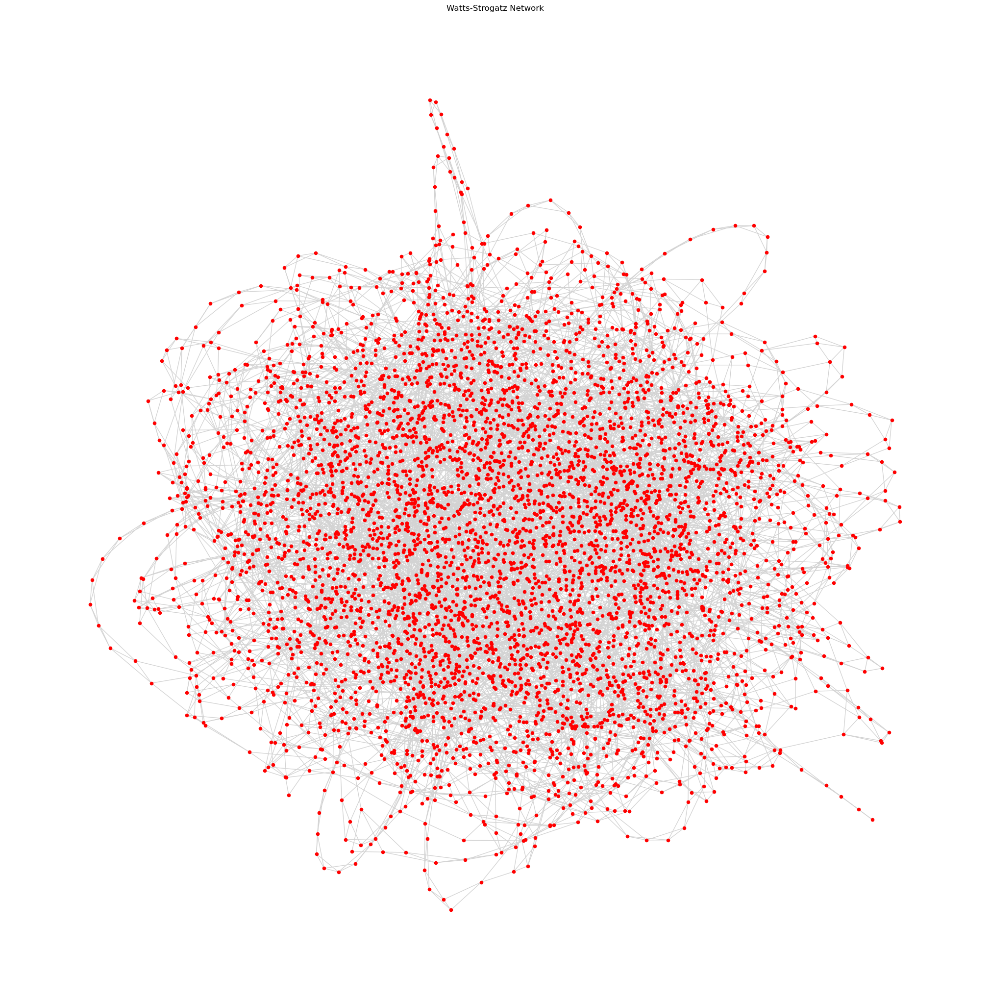

In [106]:
plt.figure(figsize=(20,20))
pos_WS = nx.spring_layout(WS_lcc, seed=42)
nx.draw(WS_lcc, pos_WS, node_size=20, node_color='red', edge_color='lightgray')
plt.title("Watts-Strogatz Network")
plt.show()

#### Barabasi-Albert scale-free graph

In [107]:
BA = nx.barabasi_albert_graph(n=graph_nodes, m=2)

BA_lcc = BA.subgraph(max(nx.connected_components(BA), key=len)).copy()
models["BA"] = {
    "Diameter": nx.diameter(BA_lcc),
    "Average clustering": nx.average_clustering(BA_lcc),
    "Average shortest path length": nx.average_shortest_path_length(BA_lcc)
}

In [108]:
for name, metrics in models.items():
    print(name, ":")
    for k, v in metrics.items():
        print(k,":",v)

ER :
Diameter : 3
Average clustering : 0.010024486914729692
Average shortest path length : 2.5898217193917077
WS :
Diameter : 23
Average clustering : 0.37145230027430043
Average shortest path length : 11.378311746441684
BA :
Diameter : 8
Average clustering : 0.009775279970178574
Average shortest path length : 4.630939017865573


`BA`

- diameter = 8 (the presence of hubs reduces the maximum path)
- average clustering = 0.009 (0.9%) (low clustering, there are hubs but the triangles are rare)
- average shortest path = 4.63 (shorter compared to WS because hubs connect many nodes)
- it is a scale-free network, with hubs that dominate the structures, but it doesn not reproduce clustering similar to real co-productions

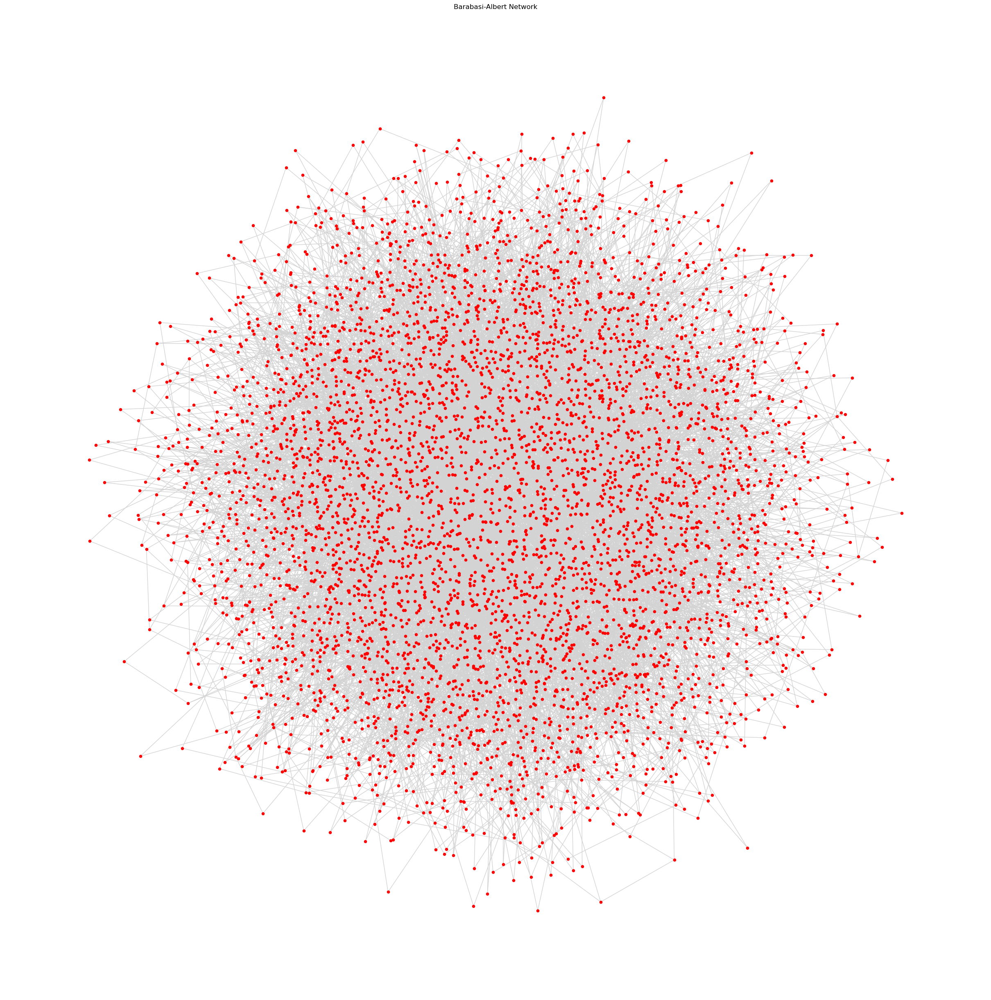

In [109]:
plt.figure(figsize=(24,24))
pos_BA = nx.spring_layout(BA_lcc, seed=42)
nx.draw(BA_lcc, pos_BA, node_size=20, node_color='red', edge_color='lightgray')
plt.title("Barabasi-Albert Network")
plt.show()

#### Original graph

In [110]:
models["Original graph"] = {
    "Diameter": nx.diameter(G_lcc),
    "Average clustering": nx.average_clustering(G_lcc),
    "Average shortest path length": nx.average_shortest_path_length(G_lcc)
}

In [111]:
for name, metrics in models.items():
    print(name, ":")
    for k, v in metrics.items():
        print(k,":",v)

ER :
Diameter : 3
Average clustering : 0.010024486914729692
Average shortest path length : 2.5898217193917077
WS :
Diameter : 23
Average clustering : 0.37145230027430043
Average shortest path length : 11.378311746441684
BA :
Diameter : 8
Average clustering : 0.009775279970178574
Average shortest path length : 4.630939017865573
Original graph :
Diameter : 10
Average clustering : 0.7462162207594487
Average shortest path length : 3.608457235127247


`Original network`

- diameter = 10
- average clustering = 0.746 (75%) ( high clustering since companies form tight co-production groups)
- average shortest path = 3.61 (small-world)
- real co-production network is small-world and highly clustered

#### Observations:

- The real production company network shows a high degree clustering, since companies often form tight co-production groups. It also displays small-world characteristics, having short average paths because most companies reach each other in just a few steps, and hubs, representing highly connected companies.

- Standard network models capture only parts of this structure: Erdos-Renyi (ER) networks are too random with very low clustering, Watts-Strogatz (WS) networks show moderate clustering but long paths, and Barabasi-Albert (BA) networks produce hubs but have no dense clustering like the ones observed in reality. None of these models fully replicate the real-world patterns of collaboration in the film industry.

In [112]:
#!!!!!!!!!!! this is different

#ER = nx.erdos_renyi_graph(n=G_lcc.number_of_nodes(), p=0.01)
#WS = nx.watts_strogatz_graph(n=G_lcc.number_of_nodes(), k=4, p=0.1)
#BA = nx.barabasi_albert_graph(n=G_lcc.number_of_nodes(), m=2)